In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import math
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error
import math

C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:520: FutureWarning: Passing (

## Average temperature model – Grant, KS

In [48]:
avg_temps = pd.read_csv("../data_KS_WA/KS/KS_Climate/KS_Grant_Avg_Temp_Additional.csv")
# avg_temps.loc[avg_temps[0].type() == int]
avg_temps.columns = ["date", "value", "anomaly"]
print(len(avg_temps))

avg_temps_years = avg_temps['date'].astype(float)
print(len(avg_temps_years))

i = 0
frac = 0
for element in avg_temps_years:
    mod = element % 100
    element = (element - mod) / 100 + frac/12
    avg_temps_years[i] = element
    i += 1
    if (frac % 12 != 11):
        frac += 1
    else:
        frac = 0

avg_temps['date'] = avg_temps_years
avg_temps.head()

1500
1500


,date,value,anomaly
0,1895.000000,26.9,-6.0
1,1895.083333,24.4,-11.7
2,1895.166667,40.3,-5.0
3,1895.250000,57.8,4.0
4,1895.333333,64.7,0.8


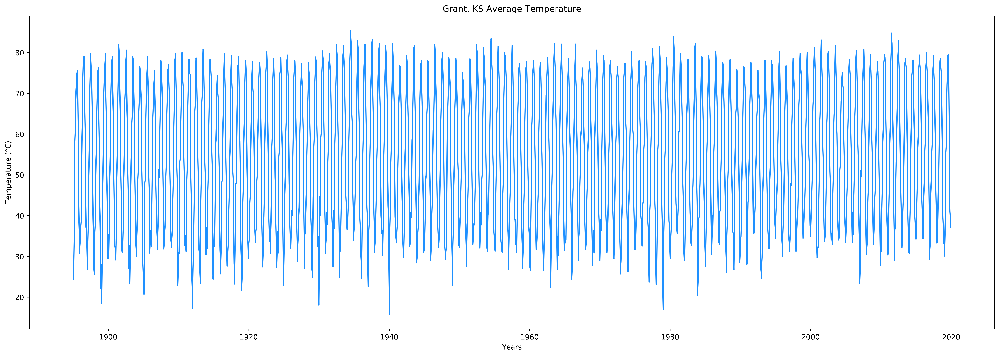

In [49]:
x_avg = avg_temps['date']
y_avg = avg_temps['value']

plt.figure(figsize=(24, 8), dpi=400)
plt.plot(x_avg, y_avg, color='dodgerblue')

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Grant, KS Average Temperature")
plt.show()

In [50]:
x_avg[0:1200]

0       1895.000000
1       1895.083333
2       1895.166667
3       1895.250000
4       1895.333333
           ...     
1195    1994.583333
1196    1994.666667
1197    1994.750000
1198    1994.833333
1199    1994.916667
Name: date, Length: 1200, dtype: float64

[ 3.50358279e+01  9.92378242e-03 -1.73971867e+06  1.00012477e+00
  1.73969442e+06]
Train Mean Squared Error:  14.1678060419579
Train Root Mean Squared Error:  3.7640146176599663
Train R^2:  0.9540632238518865
Test Mean Squared Error:  12.761531056529165
Test Root Mean Squared Error:  3.5723285202412676
Test R^2:  0.9547607442390912


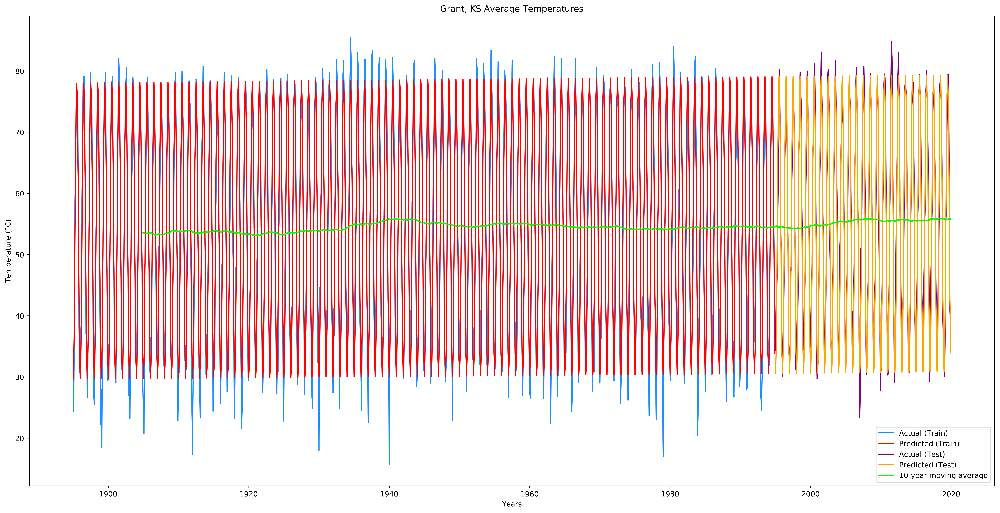

In [51]:
x2_avg = np.nan_to_num(x_avg[0:1200])
N = len(x2_avg)
y2_avg = np.asarray(y_avg[0:1200])

def test_func(t, a, b, c, d, e):
#     return  a + b*t + c*np.sin(2*np.pi/12*t + d)
    return a + b*t + c*np.sin(2*np.pi * d*t) + e*np.sin(2*np.pi * d*t)

params, _ = curve_fit(test_func, x2_avg, y2_avg)

# def test_func(m, a, b, c, d, e):
#     return  100 * a * np.sin(20 * b * m + c) + d + e * m

# params, _ = curve_fit(test_func, x, y, p0  = [100, 2 * numpy.pi / 365, 0, -10, 0])

print(params)
print("Train Mean Squared Error: ", np.mean((y2_avg - test_func(x2_avg, *params))**2))
print("Train Root Mean Squared Error: ", math.sqrt(np.mean((y2_avg - test_func(x2_avg, *params))**2)))
residuals = y2_avg - test_func(x2_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y2_avg - np.mean(y2_avg))**2)
print("Train R^2: ", 1 - (ss_res / ss_tot))

rolling_mean = avg_temps.value.rolling(window=120).mean()

x3_avg = np.nan_to_num(x_avg[1200:])
N = len(x3_avg)
y3_avg = np.asarray(y_avg[1200:])

print("Test Mean Squared Error: ", np.mean((y3_avg - test_func(x3_avg, *params))**2))
print("Test Root Mean Squared Error: ", math.sqrt(np.mean((y3_avg - test_func(x3_avg, *params))**2)))
residuals = y3_avg - test_func(x3_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y3_avg - np.mean(y3_avg))**2)
print("Test R^2: ", 1 - (ss_res / ss_tot))

plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg, y2_avg, color='dodgerblue', label='Actual (Train)')
plt.plot(x2_avg, test_func(x2_avg, params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='purple', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')
plt.plot(avg_temps.date, rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Grant, KS Average Temperatures")
plt.legend(loc='best')
plt.show()

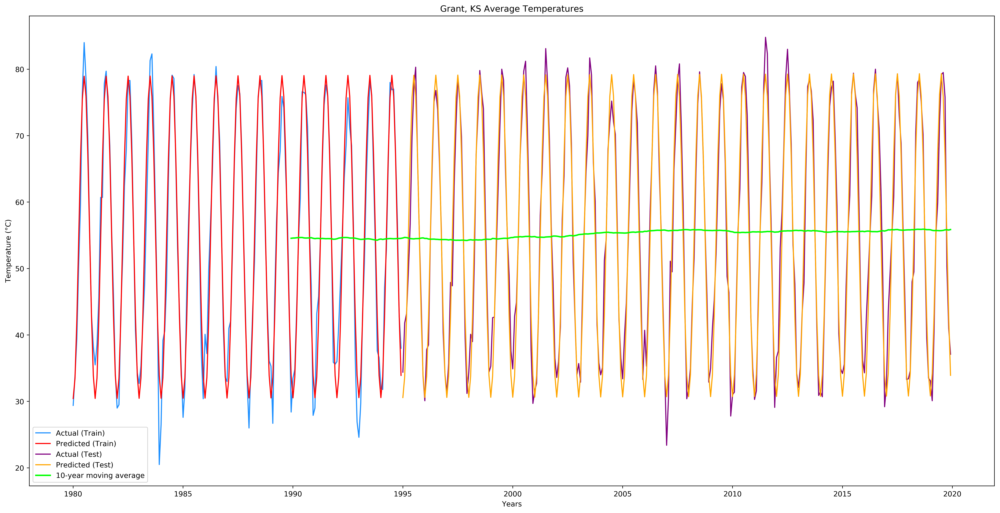

In [52]:
plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg[1020:], y2_avg[1020:], color='dodgerblue', label='Actual (Train)')
plt.plot(x2_avg[1020:], test_func(x2_avg[1020:], params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='purple', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')

rolling_mean = avg_temps.value[1020:].rolling(window=120).mean()
plt.plot(avg_temps.date[1020:], rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Grant, KS Average Temperatures")
plt.legend(loc='best')
plt.show()

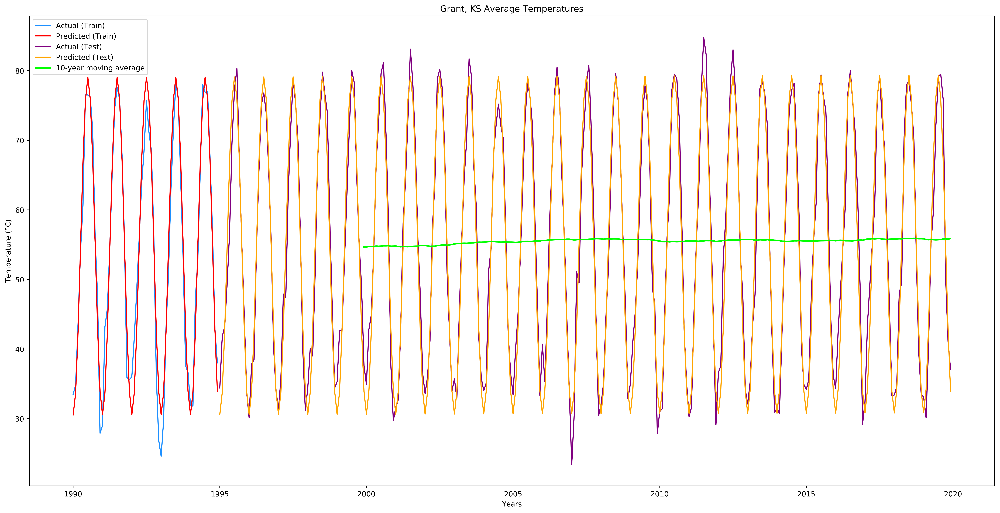

In [47]:
plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg[1140:], y2_avg[1140:], color='dodgerblue', label='Actual (Train)')
plt.plot(x2_avg[1140:], test_func(x2_avg[1140:], params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='purple', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')

rolling_mean = avg_temps.value[1140:].rolling(window=120).mean()
plt.plot(avg_temps.date[1140:], rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Grant, KS Average Temperatures")
plt.legend(loc='best')
plt.show()

Mean Squared Error:  12.761531056529165
Root Mean Squared Error:  3.5723285202412676
R^2:  0.9547607442390912


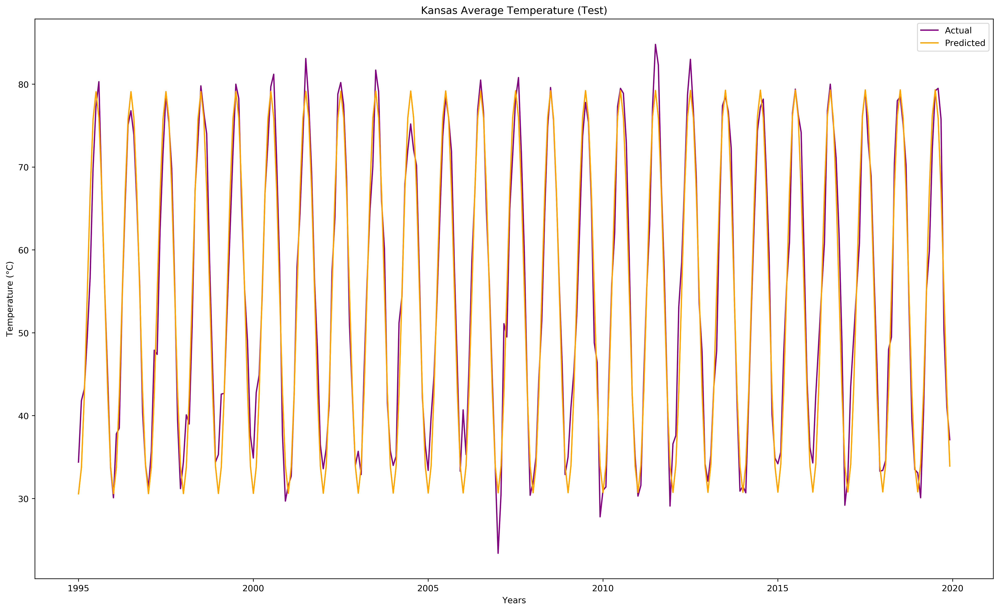

In [24]:
x3_avg = np.nan_to_num(x_avg[1200:])
N = len(x3_avg)
y3_avg = np.asarray(y_avg[1200:])

print("Mean Squared Error: ", np.mean((y3_avg - test_func(x3_avg, *params))**2))
print("Root Mean Squared Error: ", math.sqrt(np.mean((y3_avg - test_func(x3_avg, *params))**2)))
residuals = y3_avg - test_func(x3_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y3_avg - np.mean(y3_avg))**2)
print("R^2: ", 1 - (ss_res / ss_tot))

# x = np.linspace(tick_list[0],tick_list[-1],100)
# y = 44.69 + 0.0019*(x/12) + 33.69*np.sin(1.728*(x/12) + 0.704)

plt.figure(figsize=(20, 12), dpi=400)
plt.plot(x3_avg, y3_avg, color='purple', label='Actual')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted')

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Kansas Average Temperature (Test)")
plt.legend(loc='best')
plt.show()

## Precipitation model – Grant, KS

In [54]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

import itertools
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [67]:
rainfall_data = pd.read_csv("../data_KS_WA/KS/KS_Climate/KS_Grant_Precipitation.csv")
rainfall_data.drop(rainfall_data.index[[0, 1, 2, 3]], inplace=True)
rainfall_data.reset_index(drop=True, inplace=True)

# avg_temps.loc[avg_temps[0].type() == int]
rainfall_data.columns = ["date", "value", "anomaly"]
print(len(rainfall_data))

rainfall_data_years = rainfall_data['date'].astype(float)
print(len(rainfall_data_years))

i = 0
frac = 0
for element in rainfall_data_years:
    mod = element % 100
    element = (element - mod) / 100 + frac/12
    rainfall_data_years[i] = element
    i += 1
    if (frac % 12 != 11):
        frac += 1
    else:
        frac = 0

rainfall_data['date'] = rainfall_data_years
# rainfall_data = rainfall_data['date', 'value']
print(rainfall_data.shape)
print(rainfall_data[['value']].shape)
rainfall_data.head()
# print((rainfall_data['value']).shape)

371
371
(371, 3)
(371, 1)


,date,value,anomaly
0,1989.000000,0.41,0.00
1,1989.083333,0.40,0.00
2,1989.166667,0.32,-0.71
3,1989.250000,0.55,-0.99
4,1989.333333,5.56,3.25


In [140]:
test_rainfall_data = rainfall_data[['value']][287:]
print(test_rainfall_data.shape)
test_rainfall_data.head()

(84, 1)


,value
287,0.87
288,0.53
289,0.33
290,0.22
291,0.57


In [141]:
scaler = MinMaxScaler(feature_range=(0, 1))

train_data = scaler.fit_transform(rainfall_data[['value']][0:300])
test_data = scaler.fit_transform(test_rainfall_data)

In [142]:
train_data[:5]

array([[0.05639615],
       [0.05502063],
       [0.04401651],
       [0.07565337],
       [0.7647868 ]])

In [143]:
scaler.inverse_transform(train_data[:5])

array([[0.41507565],
       [0.40495186],
       [0.32396149],
       [0.5568088 ],
       [5.62883081]])

In [144]:
print("Shape of train data (1989-2013): " + str(train_data.shape))
print("Shape of test data (2014-2019): " + str(test_data.shape))

Shape of train data (1989-2013): (300, 1)
Shape of test data (2014-2019): (84, 1)


### Create dataset and convert time series data into input and labels

In [145]:
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []

    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    
    return np.array(dataX), np.array(dataY)

look_back = 12
trainX, trainY = create_dataset(train_data, look_back)
testX, testY = create_dataset(test_data, look_back)

testY

array([0.00407609, 0.03532609, 0.0298913 , 0.04891304, 0.13179348,
       0.09646739, 0.51902174, 0.42255435, 0.20652174, 0.2798913 ,
       0.23233696, 0.02173913, 0.13315217, 0.10054348, 0.09918478,
       0.05298913, 0.09782609, 1.        , 0.30163043, 0.64809783,
       0.44293478, 0.09782609, 0.55298913, 0.11413043, 0.10190217,
       0.0013587 , 0.03125   , 0.00271739, 0.72690217, 0.13858696,
       0.52581522, 0.51222826, 0.36005435, 0.11413043, 0.01902174,
       0.00543478, 0.0611413 , 0.15353261, 0.01494565, 0.37092391,
       0.63858696, 0.32608696, 0.20244565, 0.67527174, 0.46195652,
       0.39266304, 0.17119565, 0.0013587 , 0.        , 0.00271739,
       0.00271739, 0.00815217, 0.10869565, 0.36277174, 0.60326087,
       0.5298913 , 0.53940217, 0.36820652, 0.50951087, 0.03940217,
       0.20380435, 0.11141304, 0.10461957, 0.26766304, 0.04211957,
       0.75543478, 0.3111413 , 0.2798913 , 0.19972826, 0.02309783,
       0.05570652])

In [146]:
print("Shape of train input: " + str(trainX.shape))
print("Shape of train labels: " + str(trainY.shape))
print("Shape of test input: " + str(testX.shape))
print("Shape of test labels: " + str(testY.shape))

Shape of train input: (287, 12)
Shape of train labels: (287,)
Shape of test input: (71, 12)
Shape of test labels: (71,)


### Reshape data

In [147]:
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

print("Shape of train input: " + str(trainX.shape))
print("Shape of train labels: " + str(trainY.shape))
print("Shape of test input: " + str(testX.shape))
print("Shape of test labels: " + str(testY.shape))

Shape of train input: (287, 1, 12)
Shape of train labels: (287,)
Shape of test input: (71, 1, 12)
Shape of test labels: (71,)


### Create Keras model

In [76]:
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

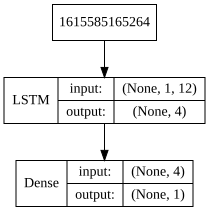

In [77]:
import keras
import pydot as pyd
import graphviz
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

keras.utils.vis_utils.pydot = pyd

#Visualize Model

def visualize_model(model):
  return SVG(model_to_dot(model).create(prog='dot', format='svg'))
#create your model
#then call the function on your model
visualize_model(model)

def plot_keras_model(model, show_shapes=True, show_layer_names=True):
    return SVG(model_to_dot(model, show_shapes=show_shapes, show_layer_names=show_layer_names).create(prog='dot',format='svg'))

plot_keras_model(model, show_shapes=True, show_layer_names=False)

In [78]:
model.fit(trainX, trainY, epochs=700, batch_size=1, verbose=2)

Epoch 1/700
 - 5s - loss: 0.0427
Epoch 2/700
 - 2s - loss: 0.0303
Epoch 3/700
 - 2s - loss: 0.0269
Epoch 4/700
 - 1s - loss: 0.0253
Epoch 5/700
 - 1s - loss: 0.0248
Epoch 6/700
 - 1s - loss: 0.0243
Epoch 7/700
 - 1s - loss: 0.0242
Epoch 8/700
 - 1s - loss: 0.0241
Epoch 9/700
 - 1s - loss: 0.0239
Epoch 10/700
 - 2s - loss: 0.0238
Epoch 11/700
 - 2s - loss: 0.0237
Epoch 12/700
 - 1s - loss: 0.0234
Epoch 13/700
 - 1s - loss: 0.0234
Epoch 14/700
 - 1s - loss: 0.0235
Epoch 15/700
 - 1s - loss: 0.0232
Epoch 16/700
 - 1s - loss: 0.0231
Epoch 17/700
 - 1s - loss: 0.0233
Epoch 18/700
 - 1s - loss: 0.0231
Epoch 19/700
 - 1s - loss: 0.0230
Epoch 20/700
 - 1s - loss: 0.0228
Epoch 21/700
 - 1s - loss: 0.0229
Epoch 22/700
 - 1s - loss: 0.0230
Epoch 23/700
 - 1s - loss: 0.0229
Epoch 24/700
 - 1s - loss: 0.0229
Epoch 25/700
 - 1s - loss: 0.0228
Epoch 26/700
 - 1s - loss: 0.0227
Epoch 27/700
 - 1s - loss: 0.0226
Epoch 28/700
 - 1s - loss: 0.0228
Epoch 29/700
 - 1s - loss: 0.0227
Epoch 30/700
 - 1s - lo

 - 1s - loss: 0.0173
Epoch 239/700
 - 1s - loss: 0.0174
Epoch 240/700
 - 1s - loss: 0.0171
Epoch 241/700
 - 1s - loss: 0.0174
Epoch 242/700
 - 1s - loss: 0.0172
Epoch 243/700
 - 1s - loss: 0.0173
Epoch 244/700
 - 1s - loss: 0.0173
Epoch 245/700
 - 1s - loss: 0.0173
Epoch 246/700
 - 1s - loss: 0.0173
Epoch 247/700
 - 1s - loss: 0.0173
Epoch 248/700
 - 1s - loss: 0.0172
Epoch 249/700
 - 1s - loss: 0.0172
Epoch 250/700
 - 1s - loss: 0.0171
Epoch 251/700
 - 1s - loss: 0.0172
Epoch 252/700
 - 1s - loss: 0.0170
Epoch 253/700
 - 1s - loss: 0.0172
Epoch 254/700
 - 1s - loss: 0.0174
Epoch 255/700
 - 1s - loss: 0.0171
Epoch 256/700
 - 1s - loss: 0.0174
Epoch 257/700
 - 1s - loss: 0.0172
Epoch 258/700
 - 1s - loss: 0.0171
Epoch 259/700
 - 1s - loss: 0.0171
Epoch 260/700
 - 1s - loss: 0.0170
Epoch 261/700
 - 1s - loss: 0.0174
Epoch 262/700
 - 1s - loss: 0.0170
Epoch 263/700
 - 1s - loss: 0.0172
Epoch 264/700
 - 1s - loss: 0.0168
Epoch 265/700
 - 1s - loss: 0.0171
Epoch 266/700
 - 1s - loss: 0.0170

Epoch 473/700
 - 1s - loss: 0.0149
Epoch 474/700
 - 1s - loss: 0.0149
Epoch 475/700
 - 1s - loss: 0.0150
Epoch 476/700
 - 1s - loss: 0.0151
Epoch 477/700
 - 1s - loss: 0.0150
Epoch 478/700
 - 1s - loss: 0.0150
Epoch 479/700
 - 1s - loss: 0.0149
Epoch 480/700
 - 1s - loss: 0.0150
Epoch 481/700
 - 1s - loss: 0.0149
Epoch 482/700
 - 1s - loss: 0.0149
Epoch 483/700
 - 1s - loss: 0.0148
Epoch 484/700
 - 1s - loss: 0.0148
Epoch 485/700
 - 1s - loss: 0.0149
Epoch 486/700
 - 1s - loss: 0.0148
Epoch 487/700
 - 1s - loss: 0.0147
Epoch 488/700
 - 1s - loss: 0.0148
Epoch 489/700
 - 1s - loss: 0.0147
Epoch 490/700
 - 1s - loss: 0.0148
Epoch 491/700
 - 1s - loss: 0.0149
Epoch 492/700
 - 1s - loss: 0.0149
Epoch 493/700
 - 1s - loss: 0.0147
Epoch 494/700
 - 1s - loss: 0.0147
Epoch 495/700
 - 1s - loss: 0.0147
Epoch 496/700
 - 1s - loss: 0.0146
Epoch 497/700
 - 1s - loss: 0.0148
Epoch 498/700
 - 1s - loss: 0.0148
Epoch 499/700
 - 1s - loss: 0.0148
Epoch 500/700
 - 1s - loss: 0.0147
Epoch 501/700
 - 1s 

### Predict values using the trained model

In [148]:
testX.shape

(71, 1, 12)

In [149]:
trainPredict = model.predict(trainX)
# testPredictInTrain = model.predict(trainX[-look_back:, :, :])
testPredict = model.predict(testX)

In [150]:
trainPredict.shape

(287, 1)

In [151]:
testY.shape

(71,)

In [152]:
trainY.shape

(287,)

In [153]:
testPredict.shape

(71, 1)

### Inverse transform the data

In [154]:
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
# testPredictInTrain = scaler.inverse_transform(testPredictInTrain)
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [155]:
testPredict.shape

(71, 1)

In [87]:
# trainPredict_dataset_like = np.zeros(shape=(len(trainPredict), 3) )
# trainPredict_dataset_like[:,0] = trainPredict[:,0]
# print(trainPredict_dataset_like)
# trainPredict = scaler.inverse_transform(trainPredict_dataset_like)[:,0]

In [88]:
# trainY.shape

In [89]:
# trainY_dataset_like = np.zeros(shape=(len(trainY), 3) )
# trainY_dataset_like[:,0] = trainY
# print(trainY_dataset_like)
# trainY = scaler.inverse_transform(trainY_dataset_like)[:,0]

In [90]:
# testPredict.shape

In [91]:
# testPredict_dataset_like = np.zeros(shape=(len(testPredict), 3) )
# testPredict_dataset_like[:,0] = testPredict[:,0]
# print(testPredict_dataset_like)
# testPredict = scaler.inverse_transform(testPredict_dataset_like)[:,0]

In [92]:
# testY.shape

In [93]:
# testY_dataset_like = np.zeros(shape=(len(testY), 3) )
# testY_dataset_like[:,0] = testY
# print(trainY_dataset_like)
# testY = scaler.inverse_transform(testY_dataset_like)[:,0]

### Calculate RMSE for train and test predictions

In [156]:
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.83 RMSE
Test Score: 1.83 RMSE


### Generate dates for index

In [95]:
dates = rainfall_data['date']
print(dates)
dates.shape

0      1989.000000
1      1989.083333
2      1989.166667
3      1989.250000
4      1989.333333
          ...     
366    2019.500000
367    2019.583333
368    2019.666667
369    2019.750000
370    2019.833333
Name: date, Length: 371, dtype: float64


(371,)

### Create Dataframes for actual values and predicted values of train data

In [96]:
trainActual = pd.DataFrame({'Precipitation': trainY[0]})
# trainActual.index = dates[0:287]
trainActual.index = dates[12:299]

trainPredictdf = pd.DataFrame({'Precipitation': trainPredict[:,0]})
# trainPredictdf.index = dates[0:287]
trainPredictdf.index = dates[12:299]

In [97]:
print(trainX.shape)
print(trainX)

(287, 1, 12)
[[[0.05639615 0.05502063 0.04401651 ... 0.01788171 0.         0.04264099]]

 [[0.05502063 0.04401651 0.07565337 ... 0.         0.04264099 0.18431912]]

 [[0.04401651 0.07565337 0.7647868  ... 0.04264099 0.18431912 0.19394773]]

 ...

 [[0.2173315  0.21182944 0.         ... 0.30261348 0.30811554 0.55708391]]

 [[0.21182944 0.         0.11966988 ... 0.30811554 0.55708391 0.35213205]]

 [[0.         0.11966988 0.07290234 ... 0.55708391 0.35213205 0.12654746]]]


In [98]:
trainY = trainY.reshape(287,)

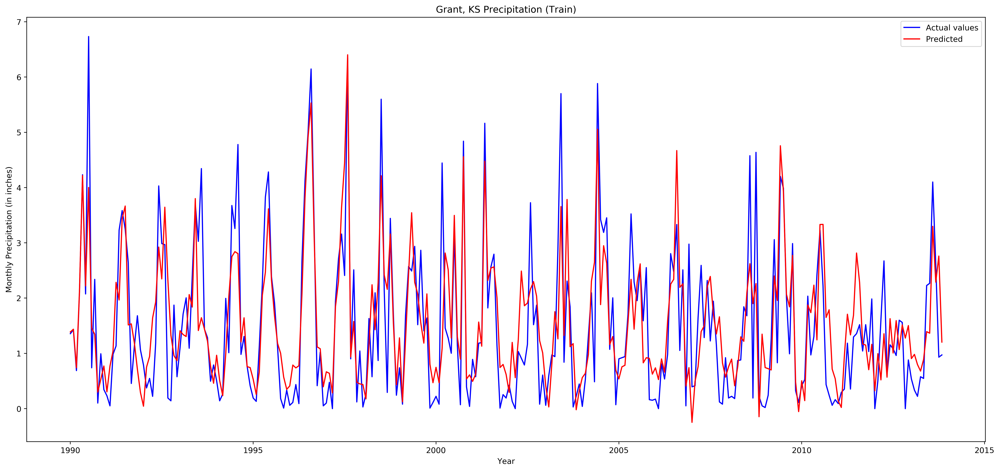

In [99]:
plt.figure(figsize=(22,10), dpi=400)
# plt.plot(dates[0:287], trainY, color='blue', label='Actual values')
# plt.plot(dates[0:287], trainPredictdf, color='red', label='Predicted')
plt.plot(trainActual, color='blue', label='Actual values')
plt.plot(trainPredictdf, color='red', label='Predicted')
plt.title('Grant, KS Precipitation (Train)')
plt.xlabel('Year')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')

In [158]:
testActual = pd.DataFrame({'Precipitation': testY[0]})
testActual.index = dates[300:]

testPredictdf = pd.DataFrame({'Precipitation': testPredict[:,0]})
testPredictdf.index = dates[300:]

In [159]:
testY[0]

array([0.03, 0.26, 0.22, 0.36, 0.97, 0.71, 3.82, 3.11, 1.52, 2.06, 1.71,
       0.16, 0.98, 0.74, 0.73, 0.39, 0.72, 7.36, 2.22, 4.77, 3.26, 0.72,
       4.07, 0.84, 0.75, 0.01, 0.23, 0.02, 5.35, 1.02, 3.87, 3.77, 2.65,
       0.84, 0.14, 0.04, 0.45, 1.13, 0.11, 2.73, 4.7 , 2.4 , 1.49, 4.97,
       3.4 , 2.89, 1.26, 0.01, 0.  , 0.02, 0.02, 0.06, 0.8 , 2.67, 4.44,
       3.9 , 3.97, 2.71, 3.75, 0.29, 1.5 , 0.82, 0.77, 1.97, 0.31, 5.56,
       2.29, 2.06, 1.47, 0.17, 0.41])

In [160]:
testPredictdf.shape

(71, 1)

In [161]:
dates[313:].head()

313    2015.083333
314    2015.166667
315    2015.250000
316    2015.333333
317    2015.416667
Name: date, dtype: float64

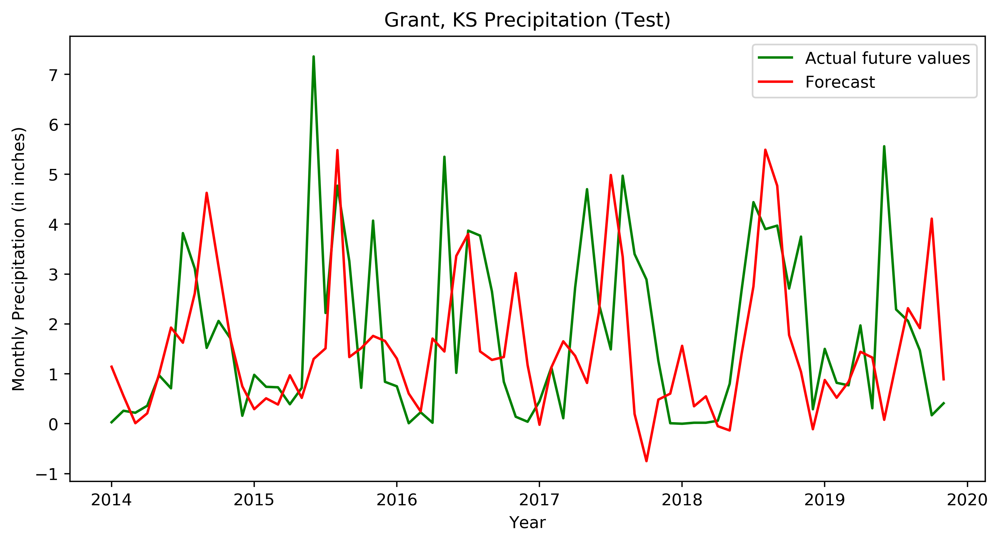

In [162]:
plt.figure(figsize=(10,5), dpi=400)
plt.plot(testActual, color='green', label='Actual future values')
plt.plot(testPredictdf, color='red', label='Forecast')
plt.title('Grant, KS Precipitation (Test)')
plt.xlabel('Year')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')

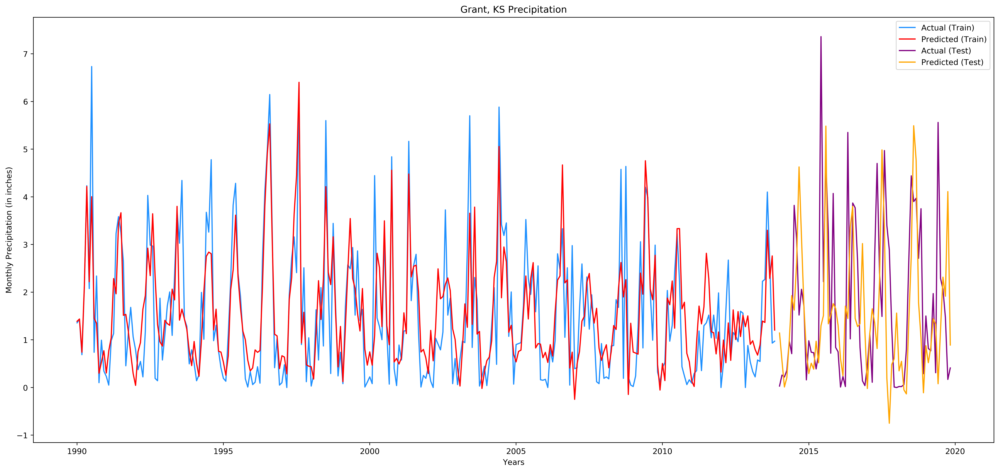

In [166]:
plt.figure(figsize=(22,10), dpi=400)
# plt.plot(dates[0:287], trainY, color='blue', label='Actual values')
# plt.plot(dates[0:287], trainPredictdf, color='red', label='Predicted')
plt.plot(trainActual, color='dodgerblue', label='Actual (Train)')
plt.plot(trainPredictdf, color='red', label='Predicted (Train)')
plt.plot(testActual, color='purple', label='Actual (Test)')
plt.plot(testPredictdf, color='orange', label='Predicted (Test)')
plt.title('Grant, KS Precipitation')
plt.xlabel('Years')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')